# IC3D generated image best/worst visualization

In [1]:
import os
import pickle

import numpy as np
import pandas as pd
import torch

import matplotlib as mpl
mpl.use('Agg')
import matplotlib.pyplot as plt
from IPython.core.display import display


import sys
sys.path.insert(0, '../')
sys.path.insert(0, '../../')
sys.path.insert(0, '../../../')

# from model_utils import tensor2img
from imgToProjection import imgtoprojection
from PIL import Image

import importlib

In [2]:
# load data provider

parent_dir = '/root/aics/modeling/gregj/projects/pytorch_integrated_cell/test_aaegan/aaegan3Dv6_128D_latent_v4'
model_dir = parent_dir + os.sep + 'struct_model' 
opt = pickle.load( open( '{0}/opt.pkl'.format(model_dir), "rb" ) )

opt.imdir = '/root/aics/modeling/gregj/results/ipp_dataset_cellnuc_seg_curated_8_24_17'

DP = importlib.import_module("data_providers." + opt.dataProvider)

data_path = os.path.join('..',os.path.basename(opt.data_save_path))
if os.path.exists(data_path):
    dp = torch.load(data_path)
else:
    dp = DP.DataProvider(opt.imdir)
    torch.save(dp, data_path)

In [18]:
# contrast adjust and remap colorspace

def tensor2img(imgs, colors=None, clip_quantile=100):
    
    if colors is None:
            colormap = 'hsv'
            colors = plt.get_cmap(colormap)(np.linspace(0, 1, imgs.shape[1]+1))
    
    imgs = imgs.numpy()
    im_out = list()
    
    #for every image
    for i in range(0, imgs.shape[0]):
        img = imgs[i]
        
        #contrast adjust each channel
        for j in range(0, img.shape[0]):
            maxval = np.max(img[j])
            if maxval > 0:
                img[j] = img[j]/maxval
                img[j] = np.clip(img[j], a_min=0, a_max=np.percentile(img[j][img[j] > 0], clip_quantile))
            
        
        img = imgtoprojection(np.swapaxes(img, 1, 3), proj_all=True, colors = colors, global_adjust=True)
        img = np.swapaxes(img, 0, 2)
        
        img = np.flip(np.flip(img,0), 1)
        
        #very light border between each projection
        img[:,-2:,:] = .25
        img[-2:,:,:] = .25
        
        im_out.append(img)
    img = np.concatenate(im_out, 1)
    return img

cmy_colors = [[1,0,1], [1,1,0], [0,1,1]]

In [23]:
def get_extremal_images(df, clip_q=100):

    ims_out = {}
    for img_label in list(df_extr_preds.img_label.unique()):
        ims_out[img_label] = {}
        for img_phase in ["train", "test"]:
            ims_out[img_label][img_phase] = {}
            for rank_type in ["best", "worst"]:
                df_temp = df
                df_temp = df_temp.loc[df_temp['img_label'] == img_label]
                df_temp = df_temp.loc[df_temp['img_phase'] == img_phase]
                df_temp = df_temp.loc[df_temp['Type'] == rank_type]
                sort_bool = rank_type!="best"
                df_temp = df_temp.sort_values('pearson_recon_median', ascending=sort_bool)
                inds_to_inspect = list(df_temp['img_dp_index'])

                ims_out[img_label][img_phase][rank_type] = tensor2img(
                                                               torch.squeeze(dp.get_images(inds_to_inspect,img_phase)),
                                                               colors=cmy_colors,
                                                               clip_quantile=clip_q)
    return ims_out

In [24]:
def display_extremal_images(ims):

    for img_label in sorted(list(df_extr_preds.img_label.unique())):

        line_width = 1
        train_ims = np.hstack([ims[img_label]["train"]["best"],
                               np.ones([ims[img_label]["train"]["best"].shape[0],line_width,3]),
                               ims[img_label]["train"]["worst"]])
        test_ims =  np.hstack([ims[img_label]["test"]["best"],
                               np.ones([ims[img_label]["train"]["best"].shape[0],line_width,3]),
                               ims[img_label]["test"]["worst"]])
        all_label_ims = np.vstack([train_ims,
                                   np.ones([1,train_ims.shape[1],3]),
                                   test_ims])

        print("{}: \u2190best/worst\u2192 & \u2191train/test\u2193".format(img_label))
        display(Image.fromarray(np.asarray(all_label_ims*255, 'uint8'), 'RGB'))

## include cells without mitotic annotations

In [21]:
# this csv file is generated by an R notebook: A1_generated_image_errror_analysis.ipynb
df_extr_preds = pd.read_csv('extremal_preds.csv')

Alpha actinin: ←best/worst→ & ↑train/test↓


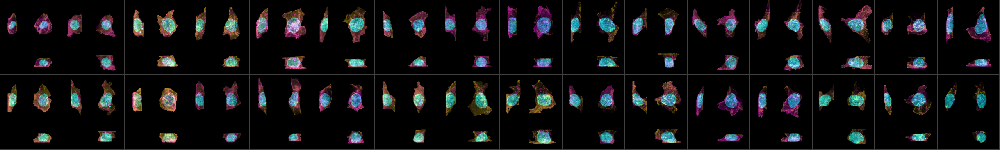

Alpha tubulin: ←best/worst→ & ↑train/test↓


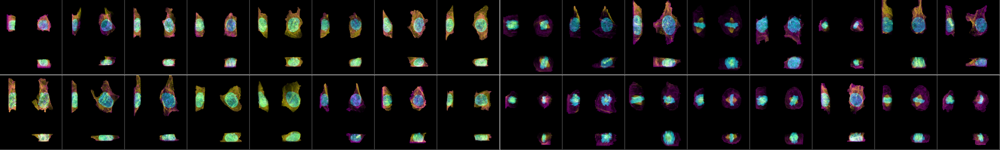

Beta actin: ←best/worst→ & ↑train/test↓


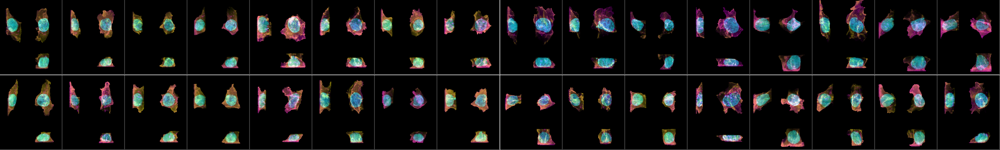

Desmoplakin: ←best/worst→ & ↑train/test↓


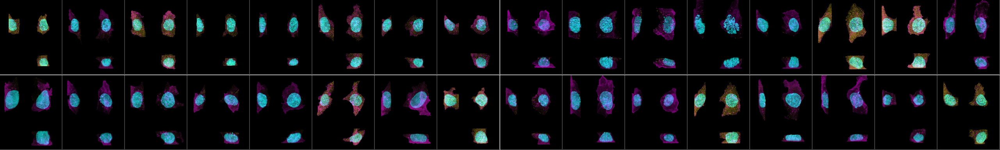

Fibrillarin: ←best/worst→ & ↑train/test↓


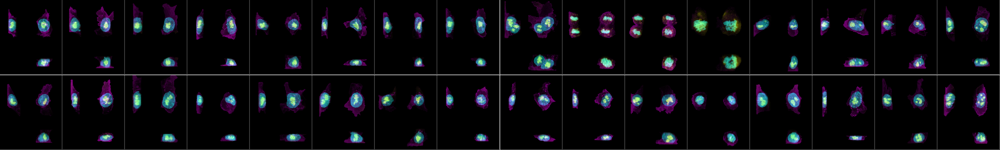

Lamin B1: ←best/worst→ & ↑train/test↓


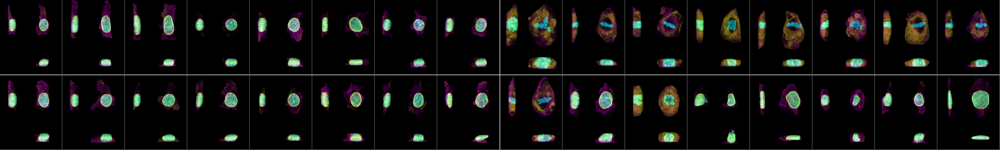

Myosin IIB: ←best/worst→ & ↑train/test↓


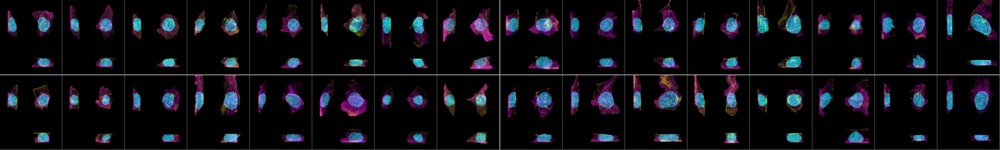

Sec61 beta: ←best/worst→ & ↑train/test↓


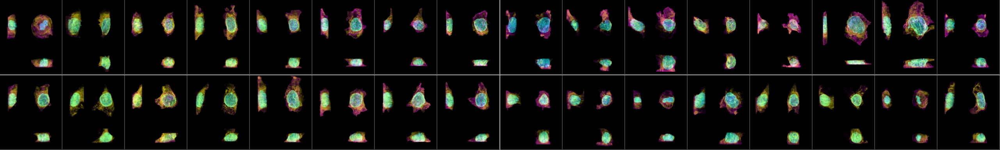

Tom20: ←best/worst→ & ↑train/test↓


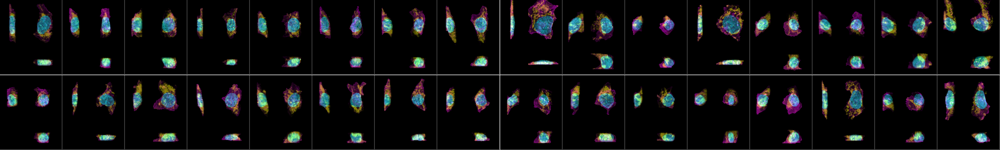

ZO1: ←best/worst→ & ↑train/test↓


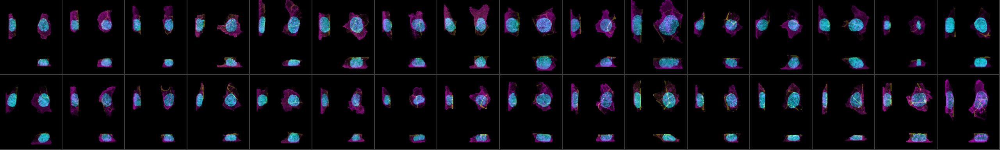

In [28]:
display_extremal_images(get_extremal_images(df_extr_preds, clip_q=99))

## only use cells with annotations

In [16]:
# this csv file is generated by an R notebook: A1_generated_image_errror_analysis.ipynb
df_extr_preds_annots_only = pd.read_csv('extremal_preds_annotated_only.csv')

Alpha actinin: ←best/worst→ & ↑train/test↓


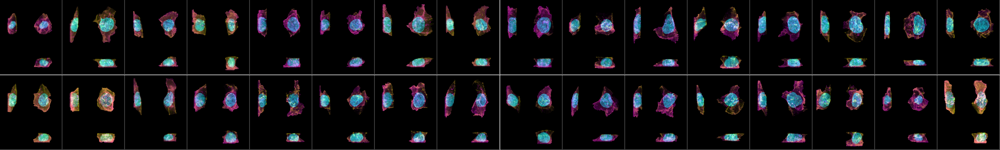

Alpha tubulin: ←best/worst→ & ↑train/test↓


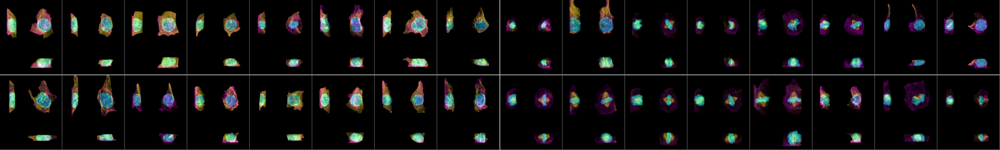

Beta actin: ←best/worst→ & ↑train/test↓


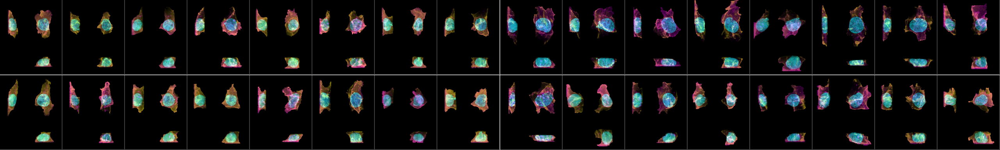

Desmoplakin: ←best/worst→ & ↑train/test↓


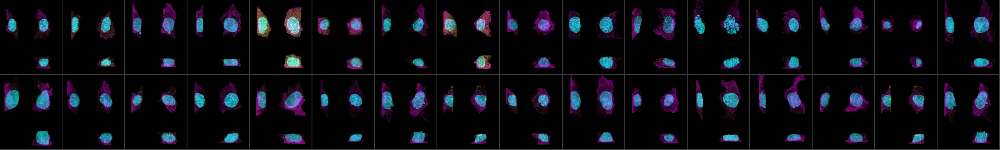

Fibrillarin: ←best/worst→ & ↑train/test↓


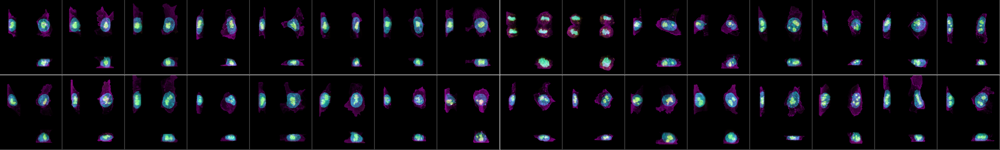

Lamin B1: ←best/worst→ & ↑train/test↓


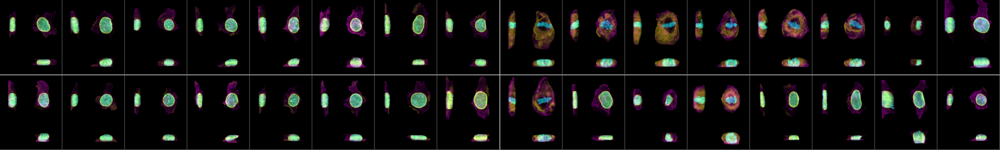

Myosin IIB: ←best/worst→ & ↑train/test↓


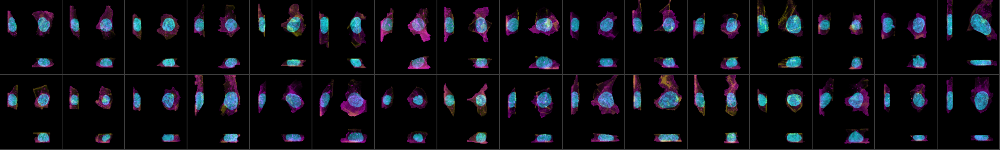

Sec61 beta: ←best/worst→ & ↑train/test↓


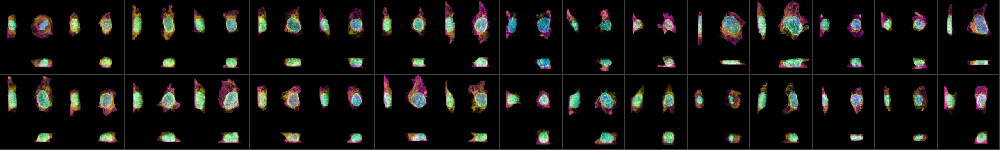

Tom20: ←best/worst→ & ↑train/test↓


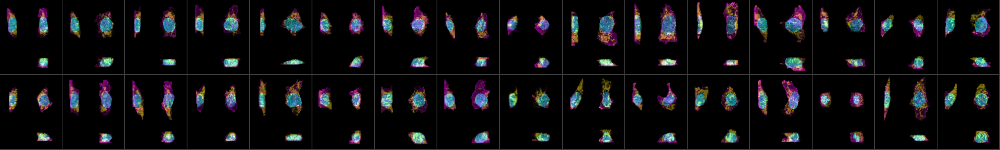

ZO1: ←best/worst→ & ↑train/test↓


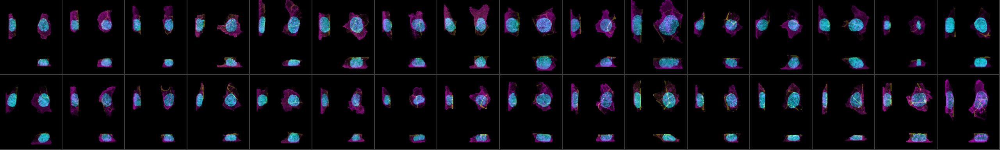

In [30]:
display_extremal_images(get_extremal_images(df_extr_preds_annots_only,clip_q=99))